# Global object CellTypist predictions
## 'Best match', Majority Voting, all genes

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scipy.io
import matplotlib.pyplot as plt
import os

import celltypist as ct
from celltypist import models

In [2]:
sc.settings.set_figure_params(dpi=300,fontsize=10)

In [62]:
OUTDIR = '/rds/general/user/snb20/projects/cardiac_single_cell_biology/live/sanger_covid19_snRNAseq/lung/lung_v2/celltypist_snb/'

In [2]:
adata=sc.read_h5ad('/rds/general/user/snb20/projects/cardiac_single_cell_biology/live/sanger_covid19_snRNAseq/lung/lung_v2/lung_atlas_integrated.h5ad')

In [3]:
#sc.pp.highly_variable_genes(adata,n_top_genes=5000)
#adata = adata[:, adata.var['highly_variable']].copy()
adata.X=adata.raw.X
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw=adata

### Split cells and nuclei in global object

In [39]:
adata_sc = adata[adata.obs["scn_source"] == "Cells"].copy()
adata_sn = adata[adata.obs["scn_source"] == "Nuclei"].copy()

In [5]:
# download specific atlas model
models.download_models(model = ["Human_Lung_Atlas.pkl", "Nuclei_Lung_Airway.pkl", "Cells_Lung_Airway.pkl"], force_update = True)
# show the local directory storing these models.
models.models_path

📜 Retrieving model list from server https://celltypist.cog.sanger.ac.uk/models/models.json
📚 Total models in list: 12
📂 Storing models in /rds/general/user/snb20/home/.celltypist/data/models
💾 Total models to download: 3
💾 Downloading model [1/3]: Cells_Lung_Airway.pkl
💾 Downloading model [2/3]: Human_Lung_Atlas.pkl
💾 Downloading model [3/3]: Nuclei_Lung_Airway.pkl


'/rds/general/user/snb20/home/.celltypist/data/models'

# HLCA Model - Combined cells / nuclei

In [6]:
predictions = ct.annotate(adata, model = "Human_Lung_Atlas.pkl", majority_voting = True, mode = 'best match')
adata = predictions.to_adata(insert_prob = False)
adata.obs["HLCA_prediction_bm"]=adata.obs["majority_voting"]

🔬 Input data has 536120 cells and 34091 genes
🔗 Matching reference genes in the model
🧬 4821 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Can not detect a neighborhood graph, will construct one before the over-clustering
/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
⛓️ Over-clustering input data with resolution set to 30
🗳️ Majority voting the predictions
✅ Majority voting done!


In [7]:
adata

AnnData object with n_obs × n_vars = 536120 × 34091
    obs: 'nCount_RNA', 'nFeature_RNA', 'cell.id', 'study.batch', 'donor', 'samples', 'sex', 'age', 'ethnicity', 'smoking_status', 'health_status', 'region', 'version_10X', 'scn_source', 'cell_type_bharat20', 'cell_states_bharat20', 'cell_type_delorey21', 'cell_states_delorey21', 'cell_type_melms21', 'cell_states_melms21', 'cell_type_SatijaAtlas', 'original_annotation', 'scn_source_study.batch', 'donor_study.batch', 'samples_study.batch', 'percent_mito', 'percent_ribo', 'scrublet.scores_samples', 'scrublet.predicted_db_samples', 'scDblFinder.score_samples', 'scDblFinder.predicted_db_samples', 'nCount_SCT', 'nFeature_SCT', 'integrated_snn_res.0.1', 'seurat_clusters', 'health_status_entropy.seurat', 'scn_source_entropy.seurat', 'scn_source_study.batch_entropy.seurat', 'donor_study.batch_entropy.seurat', 'samples_study.batch_entropy.seurat', 'health_status_entropy.seurat.hm', 'scn_source_entropy.seurat.hm', 'scn_source_study.batch_entropy

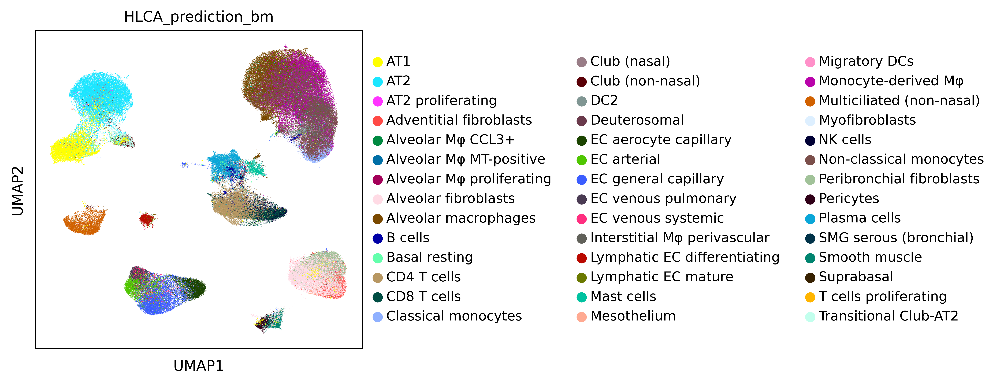

In [13]:
sc.pl.umap(adata, color = "HLCA_prediction_bm")

In [53]:
pd.crosstab(adata.obs["HLCA_prediction_bm"], adata.obs["health_status"])

health_status,COVID-19,Healthy
HLCA_prediction_bm,,
AT1,12352,16824
AT2,18659,45104
AT2 proliferating,267,218
Adventitial fibroblasts,3442,6795
Alveolar Mφ CCL3+,67,6723
Alveolar Mφ MT-positive,30,682
Alveolar Mφ proliferating,190,894
Alveolar fibroblasts,24912,8974
Alveolar macrophages,4814,60070


In [71]:
pd.crosstab(adata.obs["HLCA_prediction_bm"], adata.obs["scn_source"])

scn_source,Cells,Nuclei
HLCA_prediction_bm,,
AT1,4636,24540
AT2,29321,34442
AT2 proliferating,218,267
Adventitial fibroblasts,8670,1567
Alveolar Mφ CCL3+,6747,43
Alveolar Mφ MT-positive,701,11
Alveolar Mφ proliferating,837,247
Alveolar fibroblasts,6112,27774
Alveolar macrophages,57667,7217


In [41]:
#save new object
#adata.write('/rds/general/user/snb20/projects/cardiac_single_cell_biology/live/sanger_covid19_snRNAseq/lung/lung_v2/celltypist_snb/bm_noHVG_HLCA_lung_atlas_integrated_celltypist.h5ad')

# HCA Lung Single Nuclei model - Nuclei only

In [40]:
predictions = ct.annotate(adata_sn, model = "Nuclei_Lung_Airway.pkl", majority_voting = True, mode = 'best match')
adata_sn = predictions.to_adata(insert_prob = False)
adata_sn.obs["HCA_lung_nuclei_prediction_bm"]=adata_sn.obs["majority_voting"]

🔬 Input data has 232779 cells and 34091 genes
🔗 Matching reference genes in the model
🧬 5862 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 30
🗳️ Majority voting the predictions
✅ Majority voting done!


In [47]:
adata_sn

AnnData object with n_obs × n_vars = 232779 × 34091
    obs: 'nCount_RNA', 'nFeature_RNA', 'cell.id', 'study.batch', 'donor', 'samples', 'sex', 'age', 'ethnicity', 'smoking_status', 'health_status', 'region', 'version_10X', 'scn_source', 'cell_type_bharat20', 'cell_states_bharat20', 'cell_type_delorey21', 'cell_states_delorey21', 'cell_type_melms21', 'cell_states_melms21', 'cell_type_SatijaAtlas', 'original_annotation', 'scn_source_study.batch', 'donor_study.batch', 'samples_study.batch', 'percent_mito', 'percent_ribo', 'scrublet.scores_samples', 'scrublet.predicted_db_samples', 'scDblFinder.score_samples', 'scDblFinder.predicted_db_samples', 'nCount_SCT', 'nFeature_SCT', 'integrated_snn_res.0.1', 'seurat_clusters', 'health_status_entropy.seurat', 'scn_source_entropy.seurat', 'scn_source_study.batch_entropy.seurat', 'donor_study.batch_entropy.seurat', 'samples_study.batch_entropy.seurat', 'health_status_entropy.seurat.hm', 'scn_source_entropy.seurat.hm', 'scn_source_study.batch_entropy

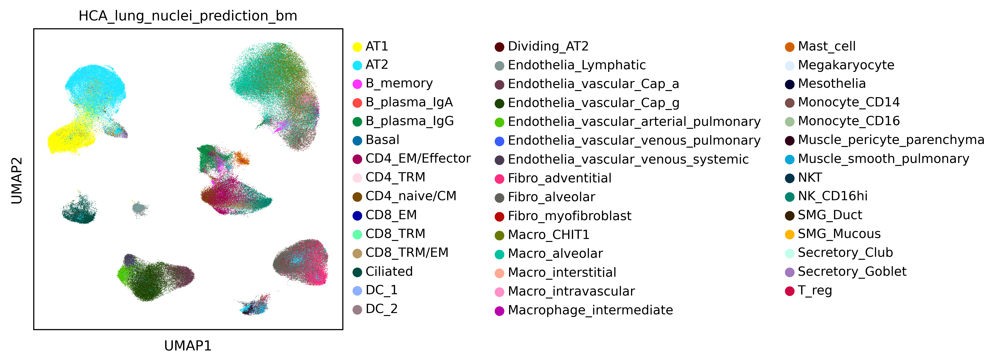

In [75]:
sc.pl.umap(adata_sn, color = "HCA_lung_nuclei_prediction_bm")

In [1]:
sc.pl.umap(adata_sn, color = "HCA_lung_nuclei_prediction_bm", groups = ["AT2"])

NameError: name 'sc' is not defined

In [58]:
pd.crosstab(adata_sn.obs["HCA_lung_nuclei_prediction_bm"], adata_sn.obs["health_status"])

health_status,COVID-19,Healthy
HCA_lung_nuclei_prediction_bm,,
AT1,10761,12367
AT2,15046,20677
B_memory,1238,1247
B_plasma_IgA,291,263
B_plasma_IgG,5716,682
Basal,450,210
CD4_EM/Effector,8751,2360
CD4_TRM,1,0
CD4_naive/CM,3350,852


In [42]:
#save new object
#adata_sn.write('/rds/general/user/snb20/projects/cardiac_single_cell_biology/live/sanger_covid19_snRNAseq/lung/lung_v2/celltypist_snb/bm_noHVG_HCA_nuclei_lung_atlas_integrated_celltypist.h5ad')

# HCA Lung Single Cell model - Cells only

In [44]:
predictions = ct.annotate(adata_sc, model = "Cells_Lung_Airway.pkl", majority_voting = True, mode = 'best match')
adata_sc = predictions.to_adata(insert_prob = False)
adata_sc.obs["HCA_lung_cells_prediction_bm"]=adata_sc.obs["majority_voting"]

🔬 Input data has 303341 cells and 34091 genes
🔗 Matching reference genes in the model
🧬 5092 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 30
🗳️ Majority voting the predictions
✅ Majority voting done!


In [50]:
adata_sc

AnnData object with n_obs × n_vars = 303341 × 34091
    obs: 'nCount_RNA', 'nFeature_RNA', 'cell.id', 'study.batch', 'donor', 'samples', 'sex', 'age', 'ethnicity', 'smoking_status', 'health_status', 'region', 'version_10X', 'scn_source', 'cell_type_bharat20', 'cell_states_bharat20', 'cell_type_delorey21', 'cell_states_delorey21', 'cell_type_melms21', 'cell_states_melms21', 'cell_type_SatijaAtlas', 'original_annotation', 'scn_source_study.batch', 'donor_study.batch', 'samples_study.batch', 'percent_mito', 'percent_ribo', 'scrublet.scores_samples', 'scrublet.predicted_db_samples', 'scDblFinder.score_samples', 'scDblFinder.predicted_db_samples', 'nCount_SCT', 'nFeature_SCT', 'integrated_snn_res.0.1', 'seurat_clusters', 'health_status_entropy.seurat', 'scn_source_entropy.seurat', 'scn_source_study.batch_entropy.seurat', 'donor_study.batch_entropy.seurat', 'samples_study.batch_entropy.seurat', 'health_status_entropy.seurat.hm', 'scn_source_entropy.seurat.hm', 'scn_source_study.batch_entropy

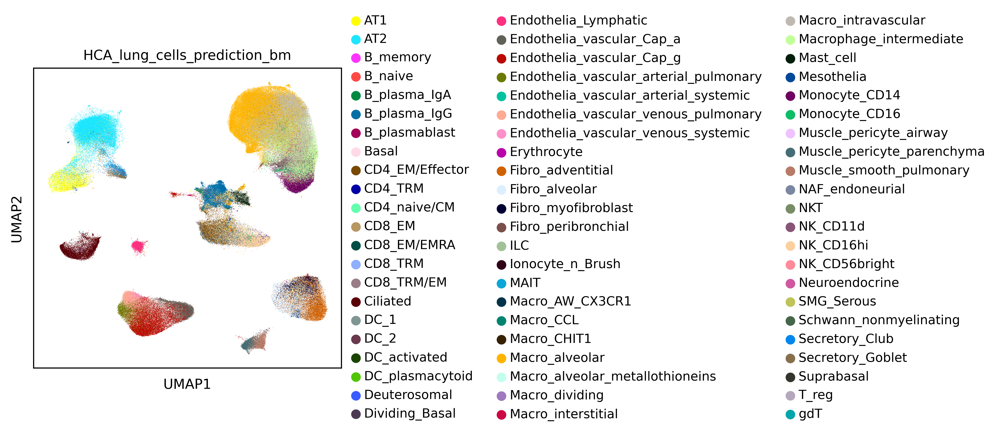

In [51]:
sc.pl.umap(adata_sc, color = "HCA_lung_cells_prediction_bm")

In [68]:
pd.crosstab(adata_sc.obs["HCA_lung_cells_prediction_bm"], adata_sc.obs["health_status"])

health_status,COVID-19,Healthy
HCA_lung_cells_prediction_bm,,
AT1,884,4125
AT2,4734,24048
B_memory,1,484
B_naive,0,13
B_plasma_IgA,44,692
...,...,...
Secretory_Club,485,1042
Secretory_Goblet,920,658
Suprabasal,0,4


In [63]:
HCA_lung_cells_prediction_bm_noHVG = pd.crosstab(adata_sc.obs["HCA_lung_cells_prediction_bm"], adata_sc.obs["health_status"])

In [66]:
HCA_lung_cells_prediction_bm_noHVG.to_csv((OUTDIR + 'HCA_lung_cells_prediction_bm_noHVG.csv'))

In [45]:
#save new object
#adata_sc.write('/rds/general/user/snb20/projects/cardiac_single_cell_biology/live/sanger_covid19_snRNAseq/lung/lung_v2/celltypist_snb/bm_noHVG_HCA_cells_lung_atlas_integrated_celltypist.h5ad')

In [ ]:
adata_sc.write('/rds/general/user/snb20/projects/cardiac_single_cell_biology/live/sanger_covid19_snRNAseq/lung/lung_v2/celltypist_snb/bm_noHVG_HCA_cells_lung_atlas_integrated_celltypist.h5ad